**Experiment with logit**

Trying out different evaluation metrics. The summary is that logistic regression seems to hit about 0.6 accuracy all the time, and different parameterizations seem to permute the predictions randomly. Basically it's just guessing at random.

In [110]:
import cv2
import numpy as np
import pandas as pd
import os
import glob
import re
import pickle
from matplotlib import pyplot as plt
import sklearn
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn import datasets, neighbors, linear_model, model_selection, svm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split, KFold, learning_curve, LeavePOut, GridSearchCV

# import private libraries
import src.utils as utils

In [10]:
train_data = pickle.load(open( "train_data_binary_threshold.pkl", "rb"))
test_data = pickle.load(open( "test_data_binary_threshold.pkl", "rb"))

In [11]:
y = train_data["y"]
X = train_data.drop('y', axis=1)
X.shape

(49, 2)

In [12]:
lpo = LeavePOut(2)

In [160]:
logistic = linear_model.LogisticRegression(solver='lbfgs', max_iter=1000, penalty='l2')

In [161]:
logistic.fit(X, y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=1000, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

In [162]:
xval_scores = model_selection.cross_val_score(logistic, X, y, cv=lpo, scoring='accuracy')

In [163]:
xval_scores_kfold = model_selection.cross_validate(logistic, X, y, cv=4, return_estimator=True)

In [164]:
xval_scores.mean()

0.5697278911564626

In [165]:
test_data_y = test_data['y']

In [166]:
test_data_x = test_data.drop('y', axis=1)

In [167]:
logistic.score(test_data_x, test_data_y )

0.42857142857142855

In [13]:
train_data_with_path = pickle.load(open( "train_data_binary_with_path.pkl", "rb"))
test_data__with_path = pickle.load(open( "test_data_binary_with_path.pkl", "rb"))

In [14]:
before_path = train_data_with_path['before_path']

In [15]:
after_path = train_data_with_path['after_path']

In [16]:
xval_scores_kfold['estimator']

NameError: name 'xval_scores_kfold' is not defined

In [169]:
for estimator in xval_scores_kfold['estimator']:
    print(test_data_y == estimator.predict(test_data_x))

2       True
32     False
24     False
24b    False
6       True
7       True
41      True
Name: y, dtype: bool
2      False
32      True
24      True
24b     True
6      False
7      False
41     False
Name: y, dtype: bool
2      False
32      True
24      True
24b     True
6      False
7      False
41     False
Name: y, dtype: bool
2      False
32      True
24      True
24b     True
6      False
7      False
41     False
Name: y, dtype: bool


In [ ]:
GridSearchCV

**Mess around with openCV thresholding**

In [111]:
path = 'legs_folder/1/10-05-15.tif'
img = cv2.imread(path, 0)

In [124]:
img.shape
cv = cv2

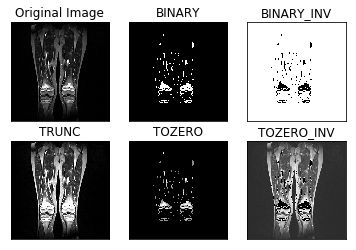

In [128]:
ret,thresh1 = cv.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv.threshold(img,127,255,cv.THRESH_BINARY_INV)
ret,thresh3 = cv.threshold(img,127,255,cv.THRESH_TRUNC)
ret,thresh4 = cv.threshold(img,127,255,cv.THRESH_TOZERO)
ret,thresh5 = cv.threshold(img,127,255,cv.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

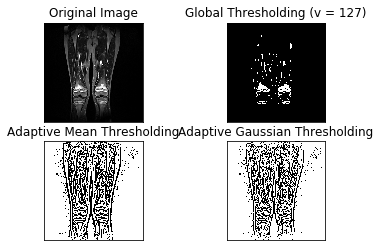

In [132]:
ret,th1 = cv.threshold(img,127,255,cv.THRESH_BINARY)
th2 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_MEAN_C,\
            cv.THRESH_BINARY,11,2)
th3 = cv.adaptiveThreshold(img,255,cv.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv.THRESH_BINARY,11,2)
titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
for i in range(4):
    plt.subplot(2,2,i+1),plt.imshow(images[i],'gray')
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])
plt.show()

**What if we preprocess with binary thresholding?**

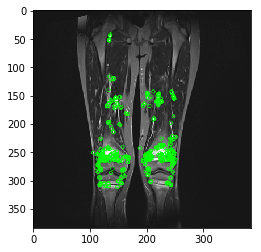

(<matplotlib.image.AxesImage at 0x1a26489fd0>, None)

In [17]:
path = 'legs_folder/1/10-05-15.tif'
img = cv2.imread(path,0)
# Initiate ORB detector
orb = cv2.ORB_create()
# find the keypoints with ORB
kp = orb.detect(img,None)
# compute the descriptors with ORB
kp, des = orb.compute(img, kp)
# draw only keypoints location,not size and orientation
img2 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
plt.imshow(img2), plt.show()

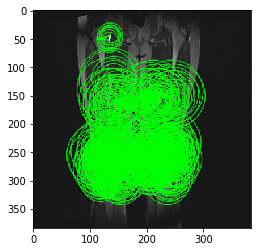

(<matplotlib.image.AxesImage at 0x10c798128>, None)

In [29]:
sift = cv2.xfeatures2d.SIFT_create()
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
(kps, descs) = sift.detectAndCompute(img, None)
img3 = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags= cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img3), plt.show()

In [37]:
kp, desc = kps[0], descs[0]

In [53]:
train_data_with_path['before_path']

1         legs_folder/1/8-16-12.tif
1         legs_folder/1/8-16-12.tif
1        legs_folder/1/11-20-13.tif
1        legs_folder/1/10-06-14.tif
1        legs_folder/1/10-05-15.tif
1         legs_folder/1/4-28-16.tif
10       legs_folder/10/11-7-12.tif
10       legs_folder/10/8-13-15.tif
10       legs_folder/10/9-22-16.tif
10        legs_folder/10/3-7-14.tif
10       legs_folder/10/11-7-12.tif
10       legs_folder/10/11-7-12.tif
10        legs_folder/10/3-7-14.tif
10        legs_folder/10/3-7-14.tif
10        legs_folder/10/3-7-14.tif
11       legs_folder/11/5-22-12.tif
12       legs_folder/12/5-29-12.tif
12       legs_folder/12/4-16-13.tif
12       legs_folder/12/5-24-14.tif
12       legs_folder/12/4-16-13.tif
16        legs_folder/16/9-4-12.tif
18      legs_folder/18/12-11-15.tif
19       legs_folder/19/7-21-16.tif
26       legs_folder/26/3-19-15.tif
26b     legs_folder/26b/2-26-13.tif
30       legs_folder/30/1-19-10.tif
30b     legs_folder/30b/1-19-10.tif
31      legs_folder/31/12-10

Hypothesis is that key points are most dense in the areas we are interested the joints. extract all features from all images, then run a clustering algorithm on the result. Now each image is given by a set of features (this is the "bag of words" analogy). Now we can run algos like naive bayes, svm, etc.

In [63]:
def detect_and_draw_orb(path):
    orb = cv2.ORB_create()
    img = cv2.imread(path,0)
    # Initiate ORB detector
    # find the keypoints with ORB
    kp = orb.detect(img,None)
    # compute the descriptors with ORB
    kp, des = orb.compute(img, kp)
    # draw only keypoints location,not size and orientation
    kps_img = cv2.drawKeypoints(img, kp, None, color=(0,255,0), flags=0)
    plt.imshow(kps_img), plt.show()
    return kp, des, kps_img
    

In [93]:
all_orb_features = pd.DataFrame()

BEFORE AND AFTER PAIR


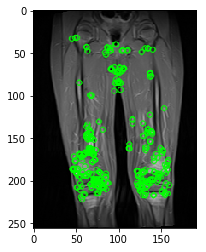

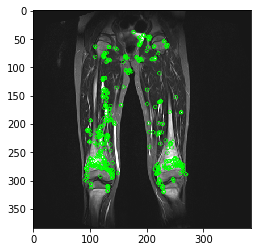

Num before: 327
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


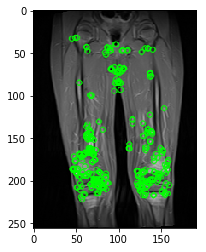

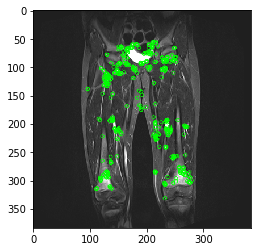

Num before: 327
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


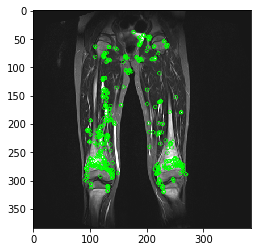

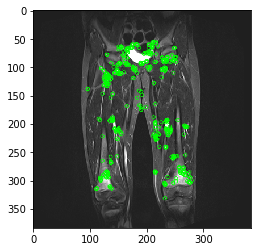

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


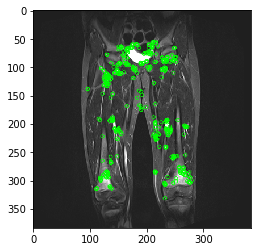

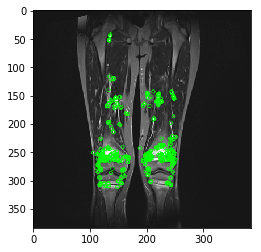

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


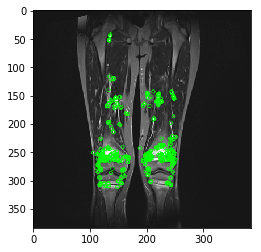

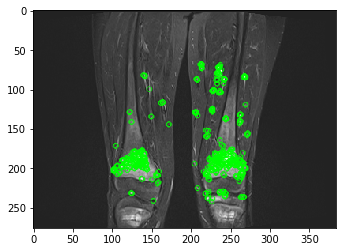

Num before: 500
Num after: 443
single des size: 32
BEFORE AND AFTER PAIR


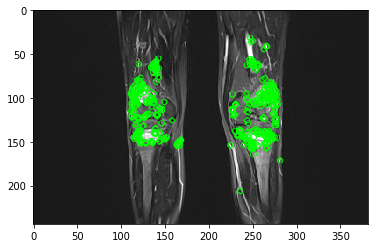

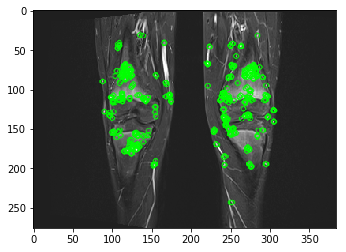

Num before: 473
Num after: 476
single des size: 32
BEFORE AND AFTER PAIR


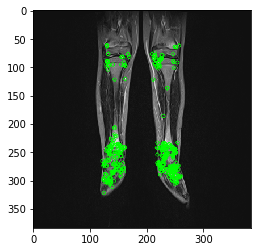

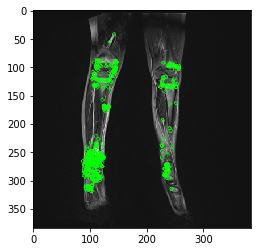

Num before: 489
Num after: 488
single des size: 32
BEFORE AND AFTER PAIR


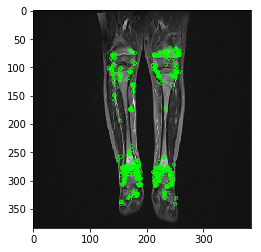

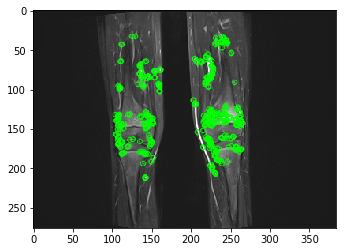

Num before: 485
Num after: 472
single des size: 32
BEFORE AND AFTER PAIR


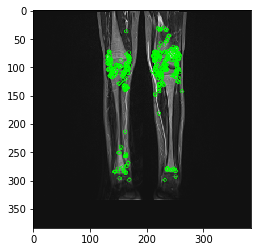

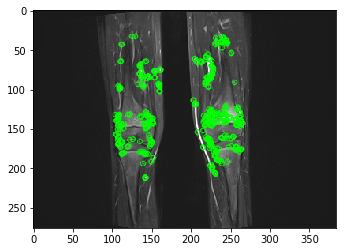

Num before: 471
Num after: 472
single des size: 32
BEFORE AND AFTER PAIR


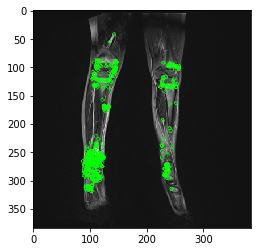

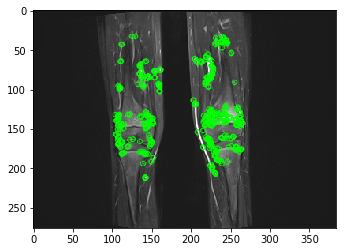

Num before: 488
Num after: 472
single des size: 32
BEFORE AND AFTER PAIR


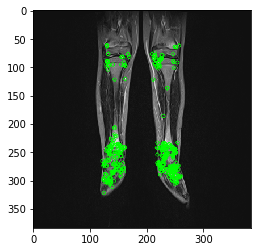

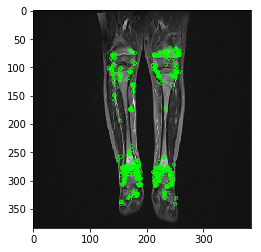

Num before: 489
Num after: 485
single des size: 32
BEFORE AND AFTER PAIR


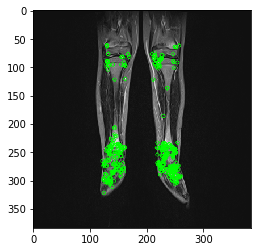

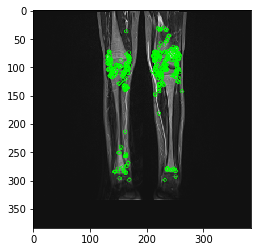

Num before: 489
Num after: 471
single des size: 32
BEFORE AND AFTER PAIR


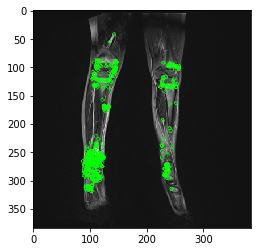

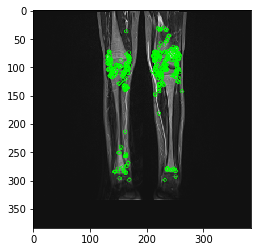

Num before: 488
Num after: 471
single des size: 32
BEFORE AND AFTER PAIR


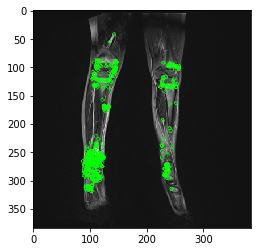

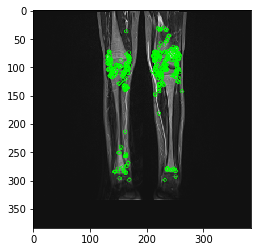

Num before: 488
Num after: 471
single des size: 32
BEFORE AND AFTER PAIR


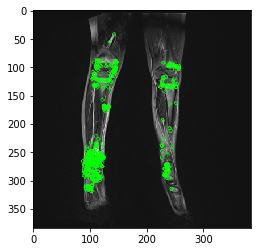

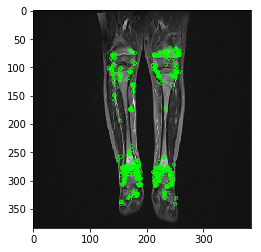

Num before: 488
Num after: 485
single des size: 32
BEFORE AND AFTER PAIR


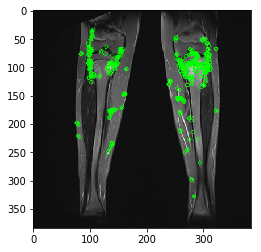

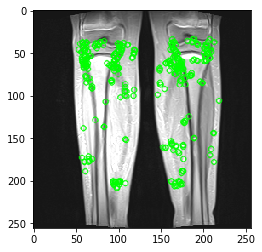

Num before: 465
Num after: 349
single des size: 32
BEFORE AND AFTER PAIR


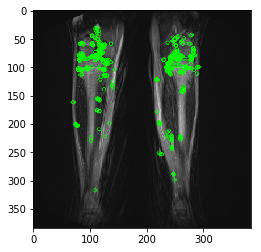

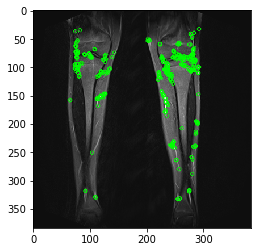

Num before: 459
Num after: 445
single des size: 32
BEFORE AND AFTER PAIR


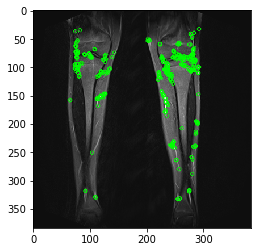

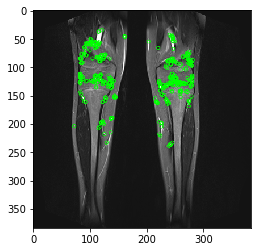

Num before: 445
Num after: 492
single des size: 32
BEFORE AND AFTER PAIR


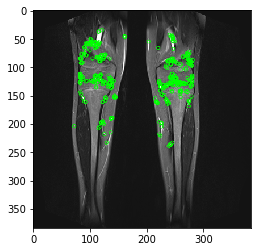

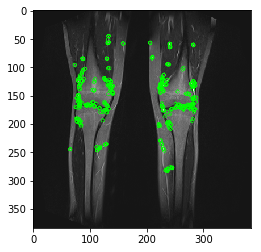

Num before: 492
Num after: 474
single des size: 32
BEFORE AND AFTER PAIR


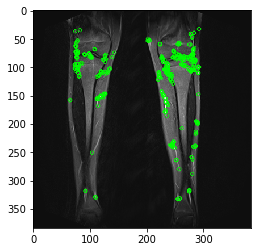

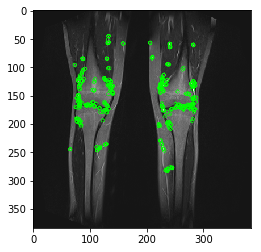

Num before: 445
Num after: 474
single des size: 32
BEFORE AND AFTER PAIR


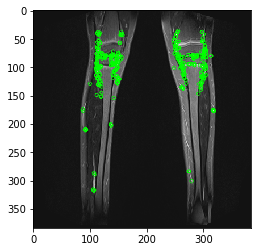

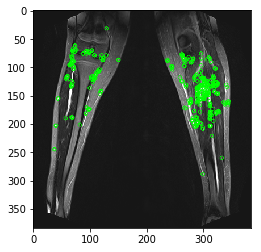

Num before: 454
Num after: 450
single des size: 32
BEFORE AND AFTER PAIR


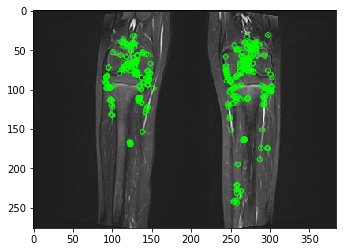

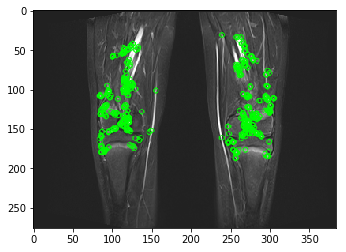

Num before: 436
Num after: 464
single des size: 32
BEFORE AND AFTER PAIR


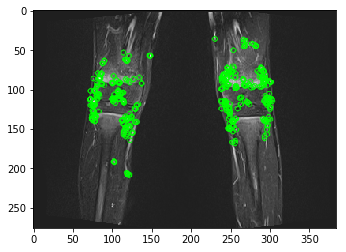

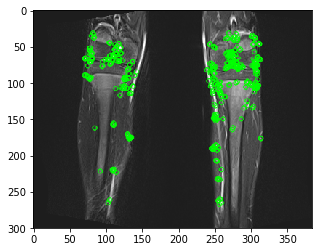

Num before: 455
Num after: 454
single des size: 32
BEFORE AND AFTER PAIR


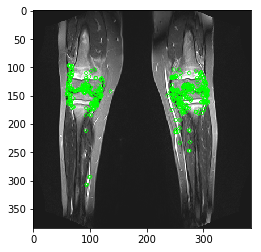

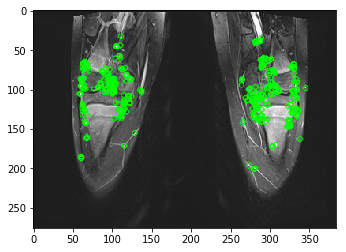

Num before: 492
Num after: 453
single des size: 32
BEFORE AND AFTER PAIR


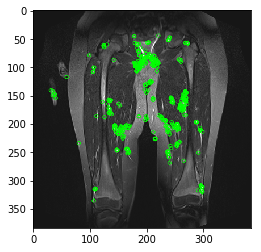

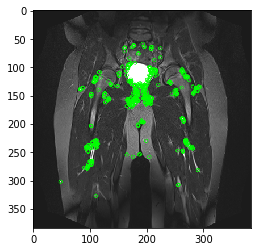

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


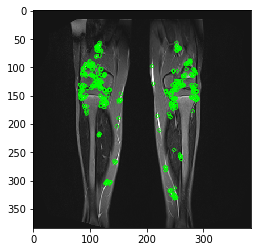

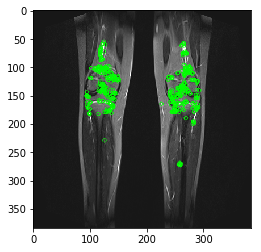

Num before: 490
Num after: 494
single des size: 32
BEFORE AND AFTER PAIR


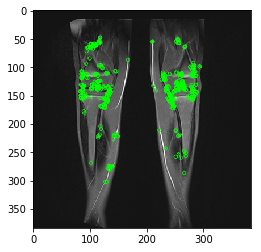

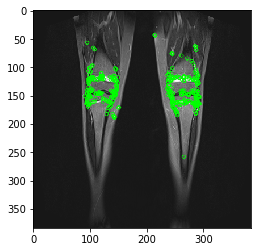

Num before: 485
Num after: 482
single des size: 32
BEFORE AND AFTER PAIR


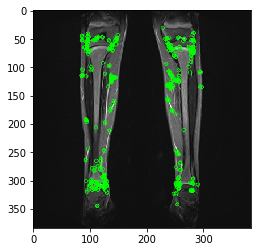

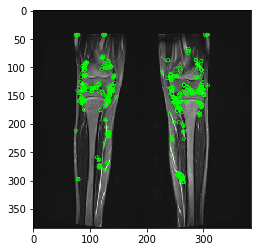

Num before: 452
Num after: 492
single des size: 32
BEFORE AND AFTER PAIR


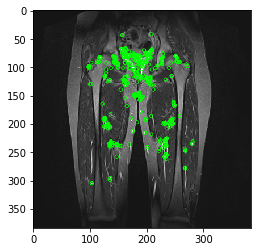

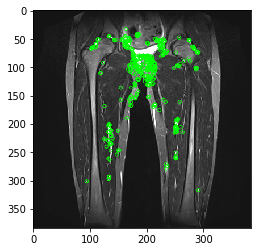

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


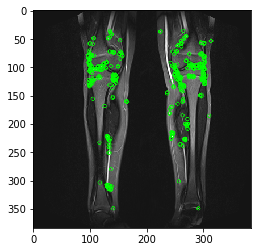

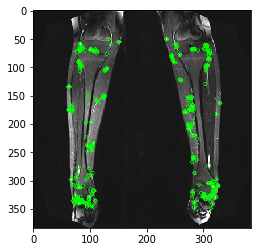

Num before: 485
Num after: 440
single des size: 32
BEFORE AND AFTER PAIR


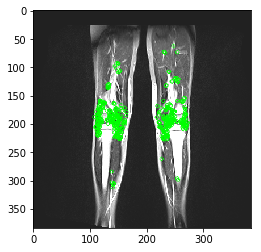

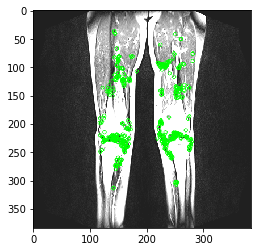

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


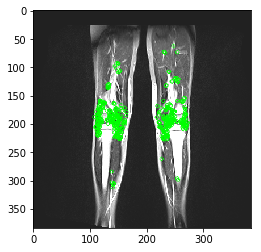

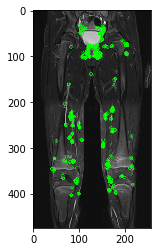

Num before: 500
Num after: 444
single des size: 32
BEFORE AND AFTER PAIR


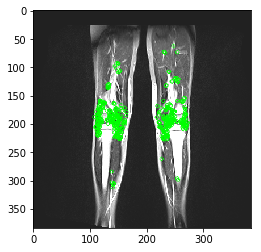

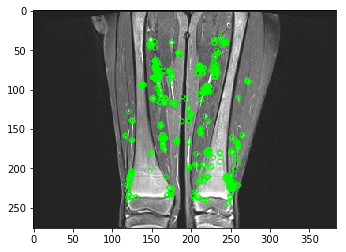

Num before: 500
Num after: 451
single des size: 32
BEFORE AND AFTER PAIR


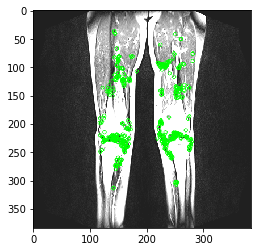

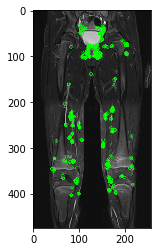

Num before: 500
Num after: 444
single des size: 32
BEFORE AND AFTER PAIR


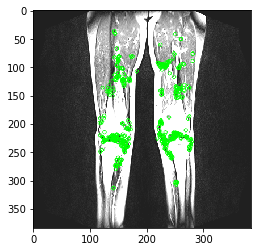

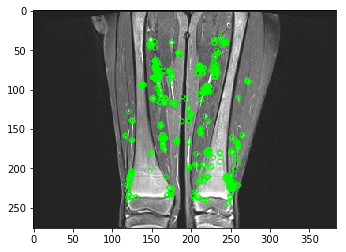

Num before: 500
Num after: 451
single des size: 32
BEFORE AND AFTER PAIR


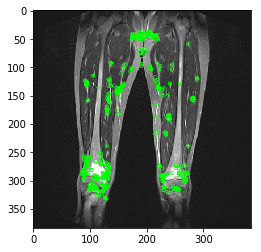

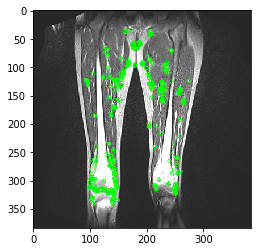

Num before: 493
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


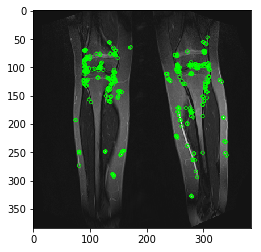

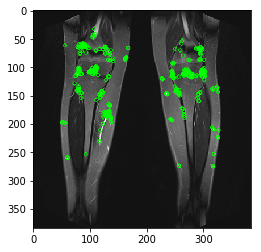

Num before: 460
Num after: 466
single des size: 32
BEFORE AND AFTER PAIR


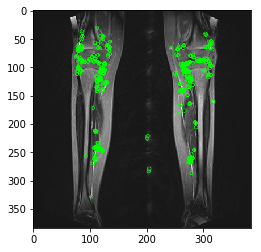

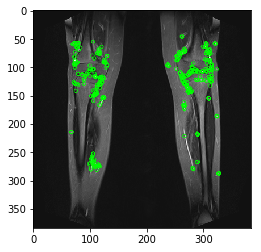

Num before: 468
Num after: 448
single des size: 32
BEFORE AND AFTER PAIR


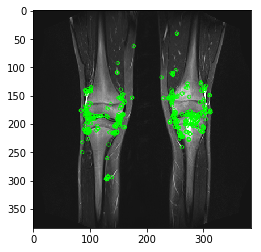

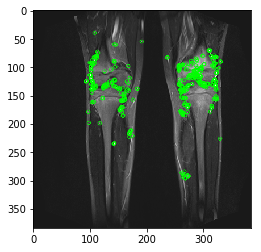

Num before: 491
Num after: 484
single des size: 32
BEFORE AND AFTER PAIR


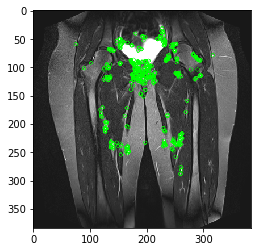

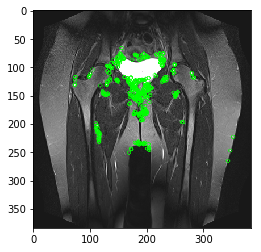

Num before: 500
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


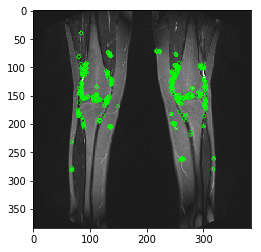

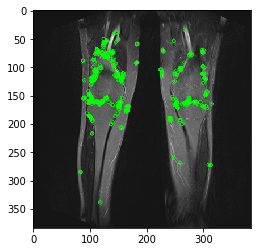

Num before: 467
Num after: 476
single des size: 32
BEFORE AND AFTER PAIR


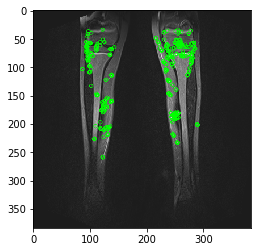

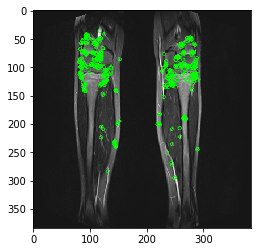

Num before: 403
Num after: 483
single des size: 32
BEFORE AND AFTER PAIR


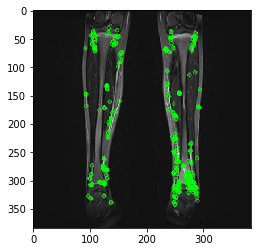

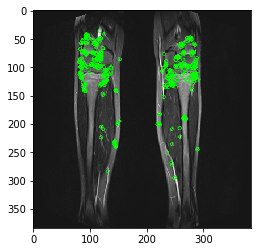

Num before: 442
Num after: 483
single des size: 32
BEFORE AND AFTER PAIR


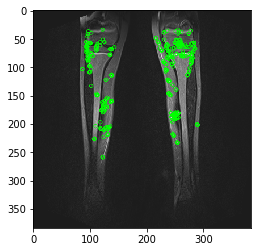

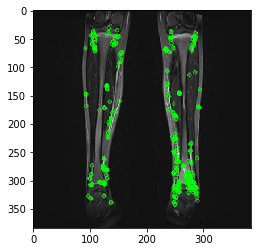

Num before: 403
Num after: 442
single des size: 32
BEFORE AND AFTER PAIR


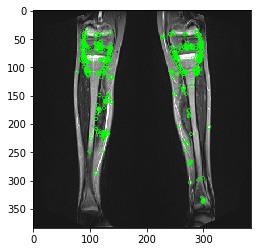

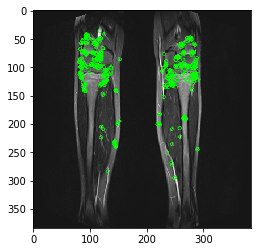

Num before: 469
Num after: 483
single des size: 32
BEFORE AND AFTER PAIR


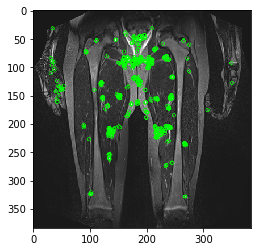

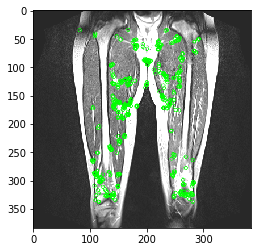

Num before: 495
Num after: 500
single des size: 32
BEFORE AND AFTER PAIR


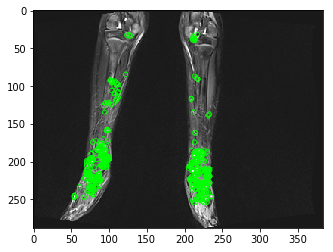

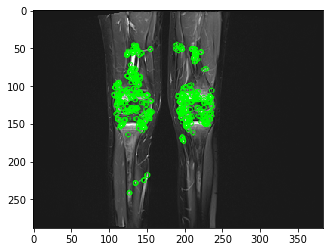

Num before: 424
Num after: 490
single des size: 32
BEFORE AND AFTER PAIR


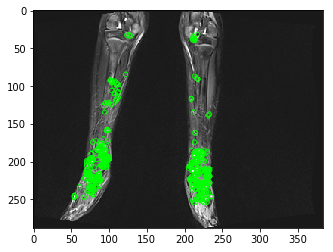

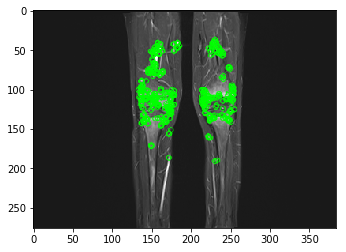

Num before: 424
Num after: 462
single des size: 32
BEFORE AND AFTER PAIR


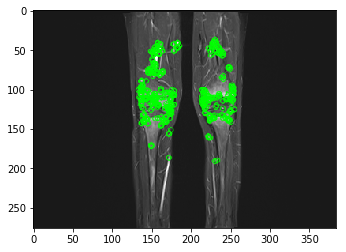

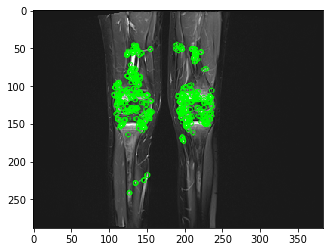

Num before: 462
Num after: 490
single des size: 32


In [94]:
for before_path, after_path in zip(train_data_with_path['before_path'], train_data_with_path['after_path']):
    print("BEFORE AND AFTER PAIR")
    before_kp, before_des, before_img = detect_and_draw_orb(before_path)
    after_kp, after_des, after_img = detect_and_draw_orb(after_path)
    all_orb_features = all_orb_features.append(pd.DataFrame(before_des))
    all_orb_features = all_orb_features.append(pd.DataFrame(after_des))
    print("Num before: " + str(len(before_des)))
    print("Num after: "+ str(len(after_des)))
    print("single des size: " + str(len(before_des[0])))
    # create BFMatcher object
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # Match descriptors.
    matches = bf.match(before_des, after_des)

    # Sort them in the order of their distance.
    matches = sorted(matches, key = lambda x:x.distance)
    #print(matches)
    # Draw first 10 matches.
    #img3 = cv2.drawMatches(before_img, before_kp, after_img, after_kp, matches, np.array([]), flags=2)

    #plt.imshow(img3),plt.show()
    

In [96]:
all_orb_features

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,243,89,127,206,78,80,95,108,197,68,...,54,253,115,169,194,27,117,154,116,126
1,214,134,12,186,184,161,26,159,159,31,...,75,247,201,214,186,223,144,128,165,83
2,244,239,186,114,137,233,23,231,187,182,...,234,51,251,215,69,127,192,115,134,98
3,164,161,120,83,220,223,195,232,82,180,...,121,22,111,217,5,117,81,137,70,160
4,229,93,216,7,228,62,238,156,124,234,...,221,34,36,237,37,4,204,243,218,4
5,245,125,77,135,188,31,206,188,65,224,...,221,174,172,30,165,52,45,251,216,21
6,133,73,87,211,228,140,108,148,124,80,...,31,224,36,184,38,128,44,147,97,141
7,210,166,173,182,168,96,29,143,186,191,...,227,227,219,243,255,251,128,80,133,123
8,194,135,31,254,170,224,57,175,175,29,...,139,119,240,178,122,216,16,192,165,43
9,132,206,165,183,188,43,239,184,86,174,...,77,47,236,134,239,132,212,251,213,97


Now we cluster our ORB features

In [108]:
kmeans_clusters = KMeans(n_clusters=500).fit(all_orb_features)

In [109]:
kmeans_clusters.cluster_centers_.shape

(500, 32)

In [140]:
data = np.ndarray((0, 500))
data = np.append(data, [np.ones(500)])
data = np.append(data, np.ones(500), axis=0)
data.shape

(1000,)

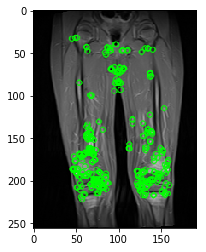

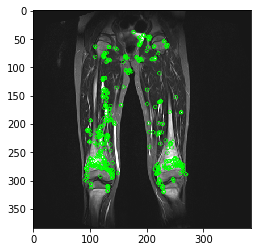

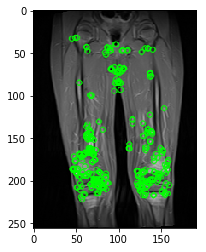

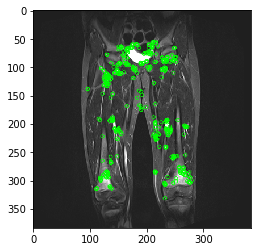

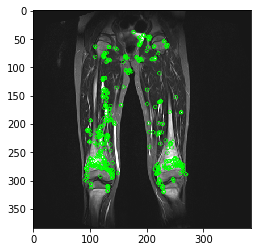

...

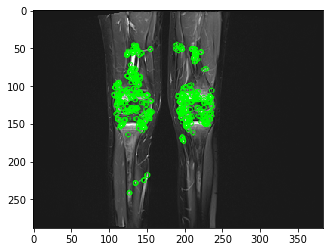

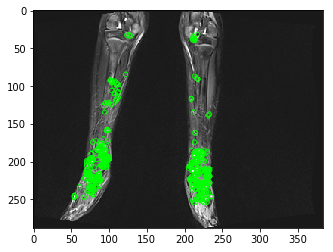

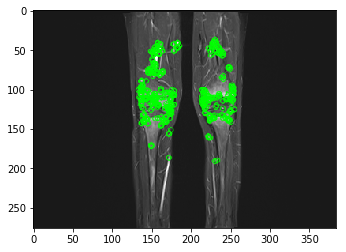

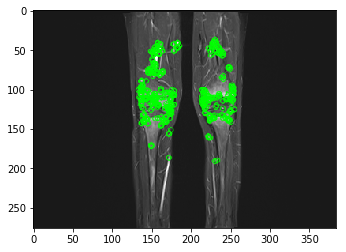

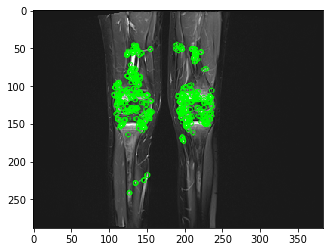

In [142]:
data = []
for i, (before_path, after_path, label) in enumerate(zip(train_data_with_path['before_path'], train_data_with_path['after_path'], train_data_with_path['y'])):
    feature_vec = np.zeros(1000)
    before_kp, before_des, before_img = detect_and_draw_orb(before_path)
    after_kp, after_des, after_img = detect_and_draw_orb(after_path)
    before_clusters = kmeans_clusters.predict(before_des)
    after_clusters = kmeans_clusters.predict(after_des)
    for c in before_clusters:
        feature_vec[c] += 1
    for c in after_clusters:
        feature_vec[500 + c] += 1
    data.append(feature_vec)
data = np.array(data)

In [116]:
cluster_hist = np.zeros(kmeans_clusters.n_clusters)

In [155]:
y = train_data_with_path['y']

In [156]:
X = pd.DataFrame(data)

In [164]:
svm_clf = SVC(gamma='auto')
svm_clf.fit(X, y)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [165]:
lpo = LeavePOut(3)

In [166]:
xval_scores = model_selection.cross_val_score(svm_clf, X, y, cv=lpo, scoring='accuracy')

In [169]:
xval_scores.mean()

0.7113728470111449